In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("C:/data/Drug_Clean.csv")
df=df.drop('Unnamed: 0',axis=1)
df.head()

,uniqueID,drugName,condition,review,rating,date,usefulCount
0,163740.0,Mirtazapine,Depression,"""I&#039;ve tried a few antidepressants over th...",10.0,28-Feb-12,22.0
1,206473.0,Mesalamine,"Crohn's Disease, Maintenance","""My son has Crohn&#039;s disease and has done ...",8.0,17-May-09,17.0
2,159672.0,Bactrim,Urinary Tract Infection,"""Quick reduction of symptoms""",9.0,29-Sep-17,3.0
3,39293.0,Contrave,Weight Loss,"""Contrave combines drugs that were used for al...",9.0,5-Mar-17,35.0
4,97768.0,Cyclafem 1 / 35,Birth Control,"""I have been on this birth control for one cyc...",9.0,22-Oct-15,4.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53495 entries, 0 to 53494
Data columns (total 7 columns):
uniqueID       53495 non-null float64
drugName       53495 non-null object
condition      53495 non-null object
review         53495 non-null object
rating         53495 non-null float64
date           53495 non-null object
usefulCount    53495 non-null float64
dtypes: float64(3), object(4)
memory usage: 2.9+ MB


In [4]:
df.describe()

,uniqueID,rating,usefulCount
count,53495.000000,53495.000000,53495.000000
mean,116416.049051,6.978353,28.075446
std,67001.187359,3.285362,36.225444
min,0.000000,1.000000,0.000000
25%,58344.000000,4.000000,6.000000
50%,116290.000000,8.000000,16.000000
75%,174606.500000,10.000000,36.000000
max,232284.000000,10.000000,949.000000


In [5]:
df.isna()

,Unnamed: 0,uniqueID,drugName,condition,review,rating,date,usefulCount
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False


In [5]:
df.isna().sum()

uniqueID       0
drugName       0
condition      0
review         0
rating         0
date           0
usefulCount    0
dtype: int64

C:\Users\Dell\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


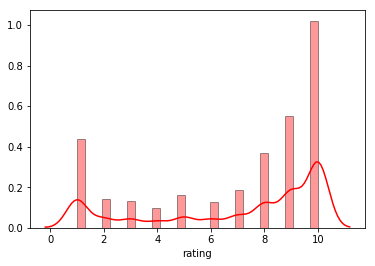

In [7]:
sns.distplot(df['rating'],hist_kws=dict(edgecolor="black", linewidth=1),color='red')

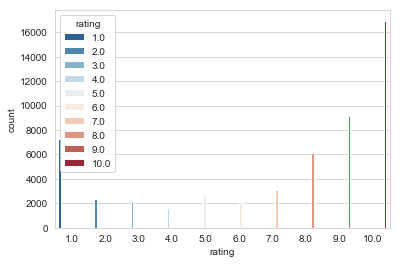

In [8]:
sns.set_style('whitegrid')
sns.countplot(x='rating',hue='rating',data=df,palette='RdBu_r')

In [5]:
import sqlite3
link="C:/data/"
conn=sqlite3.connect(link+"Drugdata2.db")
df.to_sql("Drug_Clean",conn)
print("done")

ValueError: Table 'Drug_Clean' already exists.

In [6]:
from tkinter import * 
from tkinter.ttk import *
from win32api import GetSystemMetrics

In [12]:
dcon=np.unique(df['condition'])
drugseg=df[df['condition']==dcon[7]]
drugseg.head()

,uniqueID,drugName,condition,review,rating,date,usefulCount
2669,102069.0,Brilinta,Acute Coronary Syndrome,"""Had a heart attack four years ago &amp; for t...",10.0,21-Jan-16,20.0
7007,213194.0,Ticagrelor,Acute Coronary Syndrome,"""I am ( 68 years old) taking Brilanta ( Ticagr...",10.0,1-Oct-16,2.0
16334,169191.0,Prasugrel,Acute Coronary Syndrome,"""Switched from Plavix because of gastrointesti...",6.0,14-Dec-10,32.0
17192,213199.0,Ticagrelor,Acute Coronary Syndrome,"""Hello! At this time I have no side effects""",10.0,12-Feb-16,10.0
23460,213200.0,Ticagrelor,Acute Coronary Syndrome,"""Why on earth would Brlinita be approved for h...",1.0,6-Feb-16,30.0


In [7]:
c1='OliveDrab1'
c2='white'
c3='purple1'
drg=Tk()
drg.configure(bg=c3)

w=GetSystemMetrics(0)
h=GetSystemMetrics(1)

drg.geometry(str(w)+'x'+str(h))
drg.title("Drug Prediction and Recommendation")

l1= Label(drg, text="Drug Recommender",font=("Times New Roman Bold",30))
l1.place(x=500,y=10)
l1.configure(background=c3,foreground=c2)

l1= Label(drg, text="Condition",font=("Times New Roman Bold",25))
l1.place(x=30,y=100)
l1.configure(background=c3,foreground=c2)
drugNew=pd.read_csv("C:\data/Drug_Clean.csv")
dcon=np.unique(drugNew['condition'])

cond=Combobox(drg,width=30)
cond['values']=tuple(dcon)
cond.place(x=200,y=113)

def show():
    a=cond.get()
    c=[]
    d=[]
    r=[]
    cursor=conn.execute("SELECT condition,drugName,rating FROM Drug_Clean")
    for row in cursor:
        if row[0]==a:
            c.append(row[0])
            d.append(row[1])
            r.append(row[2])
    print(c)
    print(d)
    print(r)
    cols = ('condition', 'drugName','rating')
    listBox = ttk.Treeview(drg, columns=cols, show='headings')
    listBox.place(x=600,y=120)
    for col in cols:
        listBox.heading(col, text=col)    
        listBox.place(x=600,y=120)
    cursor=conn.execute("SELECT condition,drugName,rating FROM Drug_Clean")
    curdetails=[]
    for row in cursor:
        if row[0]==a:
            listBox.insert("", "end", values=row)
btn=Button(drg,text='Click',command=show)
btn.place(x=500,y=400)

drg.mainloop()

['Abortion', 'Abortion']
['Misoprostol', 'Misoprostol']
[9.0, 7.0]


Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\Dell\Anaconda3\lib\tkinter\__init__.py", line 1705, in __call__
    return self.func(*args)
  File "<ipython-input-7-538fc16048dc>", line 42, in show
    listBox = ttk.Treeview(drg, columns=cols, show='headings')
NameError: name 'ttk' is not defined


['Abortion', 'Abortion']
['Misoprostol', 'Misoprostol']
[9.0, 7.0]


Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Users\Dell\Anaconda3\lib\tkinter\__init__.py", line 1705, in __call__
    return self.func(*args)
  File "<ipython-input-7-538fc16048dc>", line 42, in show
    listBox = ttk.Treeview(drg, columns=cols, show='headings')
NameError: name 'ttk' is not defined


NameError: name 'r' is not defined

In [17]:
cursor=conn.execute("SELECT  FROM Drug_Clean")
for row in cursor:
    print(row)

(0, 163740.0, 'Mirtazapine', 'Depression', '"I&#039;ve tried a few antidepressants over the years (citalopram, fluoxetine, amitriptyline), but none of those helped with my depression, insomnia &amp; anxiety. My doctor suggested and changed me onto 45mg mirtazapine and this medicine has saved my life. Thankfully I have had no side effects especially the most common - weight gain, I&#039;ve actually lost alot of weight. I still have suicidal thoughts but mirtazapine has saved me."', 10.0, '28-Feb-12', 22.0)
(1, 206473.0, 'Mesalamine', "Crohn's Disease, Maintenance", '"My son has Crohn&#039;s disease and has done very well on the Asacol.  He has no complaints and shows no side effects.  He has taken as many as nine tablets per day at one time.  I&#039;ve been very happy with the results, reducing his bouts of diarrhea drastically."', 8.0, '17-May-09', 17.0)
(2, 159672.0, 'Bactrim', 'Urinary Tract Infection', '"Quick reduction of symptoms"', 9.0, '29-Sep-17', 3.0)
(3, 39293.0, 'Contrave', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




(10864, 75844.0, 'Temazepam', 'Insomnia', '"Restoril really helped me sleep.  Sleeplessness was the cause of fibromyalgia for me and my rheumatologist prescribed it and I was able to sleep and deal with physical pain. What he did not tell me at all was the potential dangers of it. DO NOT drink and take it. You could die because it can cause your respiratory system to shut down.  If you have taken it a long time, DO NOT wean yourself off abruptly.  You could have seizures.  I am being slowly weaned off of it by a doctor who is alternating dosages from 15 mg. to 30 mg. per night. I plan on giving myself plenty of time to get off of it.  Be careful which medicines you use with it such as anti-inflammatories. They can increase the effects of the medicine without your expecting it."', 8.0, '14-Jun-13', 126.0)
(10865, 62249.0, 'Citalopram', 'Anxiety and Stress', '"Doctor gave me citalopram as I was having really bad anxiety attacks, the first 2-3 days were awful, I kept being sick, felt so 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(22100, 49717.0, 'Ethinyl estradiol / levonorgestrel', 'Birth Control', '"Pretty sure this medication has been making me gain weight. Also my periods take 2 weeks, that&#039;s half my life! So I take the pink pills straight with no period because I can&#039;t do that. I will have to go back to seasonique."', 5.0, '4-Jun-15', 0.0)
(22101, 112132.0, 'Gabapentin', 'Bipolar Disorde', '"Took this drug for 6 months.  It did nothing for my mood, but it added inches to my waistline.  Worse, it made me scatterbrained as hell, kinda in a sneaky way as I slowly titrated, so that I didn&#039;t realize how bad it had affected my brain till I was off it, &amp; suddenly I wasn&#039;t a super ditz anymore."', 1.0, '22-Apr-17', 14.0)
(22102, 86599.0, 'Invokana', 'Diabetes, Type 2', '"I have been on Invokana since September 2013, so a little over a year. I have experienced hair loss, tiredness, and yeast infections. I talked to my doctor about the hair loss, which I experienced for over a year. He has u

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(34150, 178961.0, 'Victoza', 'Diabetes, Type 2', '"Started Victoza October 6th 2010. I have lost 13 lbs. I am having severe abdominal pain. I really need to lose this weight. I also am taking Actos. My blood sugar is now normal."', 5.0, '16-Oct-10', 6.0)
(34151, 84250.0, 'Ethinyl estradiol / norgestimate', 'Birth Control', '"For anyone who has any trouble with anxiety or depression, I HIGHLY suggest you do not try this birth control. I have been on this pill for about a week now and increasingly over the past 5 days I have been nauseated at night and SEVERELY depressed and I mean severely. Crying constantly, overthinking, irritable, mood swings, anxious to no end. I am absolutely without a doubt getting off of this medicine, I am a nursing student who has many responsibilities and cannot deal with having no motivation to do homework. Please try your best to avoid this medication at all costs."', 1.0, '5-Mar-17', 13.0)
(34152, 4320.0, 'Capsaicin', 'Osteoarthritis', '"I have arthritis in

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(46185, 213940.0, 'Tioconazole', 'Vaginal Yeast Infection', '"Worst nightmare ever! I had a slight yi and was on antibiotics so I thought I&#039;ll cut it off at the pass and spring for the big guns so I opted for the ovule. Day 1 was fine no real issues. I woke up day 2 with the biggest mother of all itches and it burned too I tried the cream that comes with it made it worse!?! My lady parts swelled . I took oatmeal bath read other reviews and decided it was just a bad reaction. day 3 hives on my thighs and hips. Then the moved to anywhere I scatched a welt would show up. The only relief for the itch was ice but I was a little afraid to get frostbite on my burning deformed lady bits. Day 4 woke up at 4am went to urgent care am on prednisone and Benadryl the Dr said don&#039;t ever use again. the end!"', 1.0, '14-Sep-16', 2.0)
(46186, 208966.0, 'Belsomra', 'Insomnia', '"Took ambien with no problems. Doctor wanted me to come off ambien and try Belsomra. He gave me samples. Took a 10mg d

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [39]:
a=['Fluorouracil', 'Fluorouracil', 'Fluorouracil', 'Carac', 'Fluorouracil', 'Fluorouracil', 'Efudex', 'Tolak']
b=[10.0, 3.0, 10.0, 10.0, 7.0, 1.0, 9.0, 3.0]
lu=[]
for i in a:
    if i not in lu:
        lu.append(i)
print(lu)

['Fluorouracil', 'Carac', 'Efudex', 'Tolak']


In [40]:
ind=[]
for i in lu:
    ind.append(a.index(i))
print(ind)

[0, 3, 6, 7]


In [41]:
rat=[]
for i in ind:
    rat.append(b[i])
print(rat)

[10.0, 10.0, 9.0, 3.0]
